# Example


This code shows how to implement a simple physarum-simulation in python, using my `physarum`-package.  The package is heavily inspired by/derivative of work by [**Sage Jenson**](https://sagejenson.com/physarum) and [**Jason Rampe**](https://softologyblog.wordpress.com/2019/04/11/physarum-simulations/), and geared towards the production of digital art and playful experimentation. Have fun!

## Installation

You should be able to install the package with a simple:
`pip install physarum`


## Usage
We start by importing the `physarum`-package.

In [1]:
%load_ext autoreload
%autoreload 2
import physarum



In [2]:
# # standards:
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns

# # image utils:
# from PIL import Image as IMG
# from IPython.display import Image 
# from skimage import data, color
# from skimage.transform import rescale, resize, downscale_local_mean
# import cv2 # for rescaling

# # for the blurring:
# from scipy.ndimage.filters import gaussian_filter, uniform_filter

# # to monitor progress:
# import tqdm

# # to save movies:
# import imageio
# from datetime import datetime

# # for colormaps
# import palettable
# import cmocean 
# from colorsys import hls_to_rgb
# from matplotlib import cm
# from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# # to speed up computation
# import numba

# # noise for the starting-positions:
# import noise
# from scipy import interpolate

## Setting up the colormaps
Before we run our simulation, we have to set up the colormaps that we want to use for each of our physarum-populations. I like to use the little function below that allows me to produce colormaps from a list of `[hue,chroma,luminosity]`-triples, but in principle you can just use any matplotlib-colormap.

The first colormap can be fully opaque, but the other two will be overlayed, so the will need some transparancy given by the ` alpha-distribution`-parameter in the form `[alpha with which to start, percentage at which to start, alpha with which to end, percentage at which to end]`. The current examples leave the bottom 10% of the colormap fully transparent, the top 20% at 90% transparency, with a regular increase in between.

The function also automatically plots your colormap. With the basecolor-parameter, you can set the background of this plot.



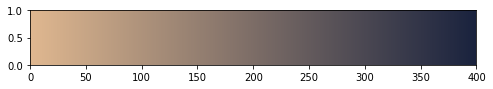

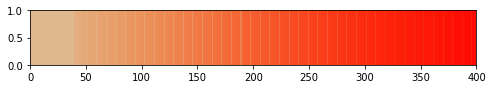

In [3]:
### # make_colormap([[0,90,50],[50,90,50],[100,90,50],[150,90,50],[200,90,50],[250,90,50],[300,90,50],[350,90,50]],alpha=False)
species_a_color = physarum.make_colormap([[30,56,72],[225,42,17]],alpha_distribution=False)
species_b_color = physarum.make_colormap([[27,94,58],[2,100,50]],alpha_distribution=[0.1,0.1,0.9,0.8], basecolor= species_a_color(0))



## Setting up basic parameters

We set up the basic parameters for our simulation: width, height (in px) and the amount of itererations for which we want it to run. 

In [19]:
width = 700
height = 700
t = 200 

## Setting up the initial positions
Then we have to set up the initial positions of our particles. The package provides several functions for this, which all return a tuple of xy-coordinates. A list of these tuples will then be passed to the init-function when we construct a physarum-population.

In this example, we set up a population that is initiated with a large circle made of 100000 particles in the center and some perlin-noise (300000 particles) around it. To see how that looks like, we then plot the resulting coordinates with matplotlib.


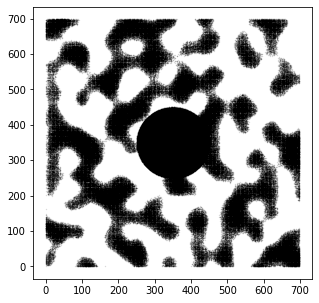

In [31]:
init=[physarum.get_filled_circle_init(n=100000, center=(350,350),radius=100),
        physarum.get_perlin_init(shape=(height,width), n=300000,scale=80)]


# plot the init with matplotlib (not necessary, only for illustration):
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(5,5))
init_to_plot = np.vstack([i[0] for i in init]),np.vstack([i[1] for i in init])
init_to_plot = np.hstack(init_to_plot)

plt.scatter(init_to_plot[:,0],init_to_plot[:,1],s=0.1, c='black',alpha=0.2)

## Setting up the populations

Now we set up our physarum-populations. There are several parameters to play with. First we need to inform each population about the environment it's living in by passing it the height, width and time-parameters. Then we need to set up the length of every step which each particle will do in every tick of the simulation (`horizon_walk`), and how far ahead the particle will look before doing that step (`horizon_sense`).


In [34]:
species_a = physarum.physarum_population(height=height,width=width,t=t,
                                horizon_walk=1,horizon_sense=9,
                                theta_walk=15,theta_sense=10.,walk_range = [1.,2.],
                                colormap=species_a_color,
                                social_behaviour =0,trace_strength = 1,
                                initialization=init)


species_b = physarum.physarum_population(height=height,width=width,t=t,
                                horizon_walk=1,horizon_sense=9,
                                theta_walk=15,theta_sense=10.,walk_range = [0.9,1.2],
                                colormap=species_b_color,
                                social_behaviour = -16,trace_strength = 1,
                                initialization=[physarum.get_perlin_init(shape=(height,width), n=300000,scale=380)])



## Running the simulation


Step No.: 0


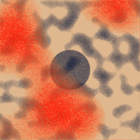

Step No.: 50


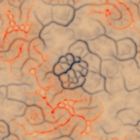

Step No.: 100


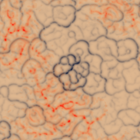

Step No.: 150


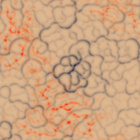

[<PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD448>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD808>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD308>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD3C8>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDDB48>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD088>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD488>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDDB08>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD348>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85CDD388>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85772608>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85530BC8>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85772DC8>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85772808>,
 <PIL.Image.Image image mode=RGBA size=700x700 at 0x1AF85772408>,
 <PIL.Imag

In [35]:

species_list = [species_a,species_b]
images=[]
physarum.run_physarum_simulation(populations = species_list, image_list=images,show_image_every=50)

## Saving

In [36]:
physarum.save_film(images,name="example_film.mp4")

physarum.save_film(images,name="example_film.gif", format="gif")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (700, 700) to (704, 704) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


![](example_film.gif)

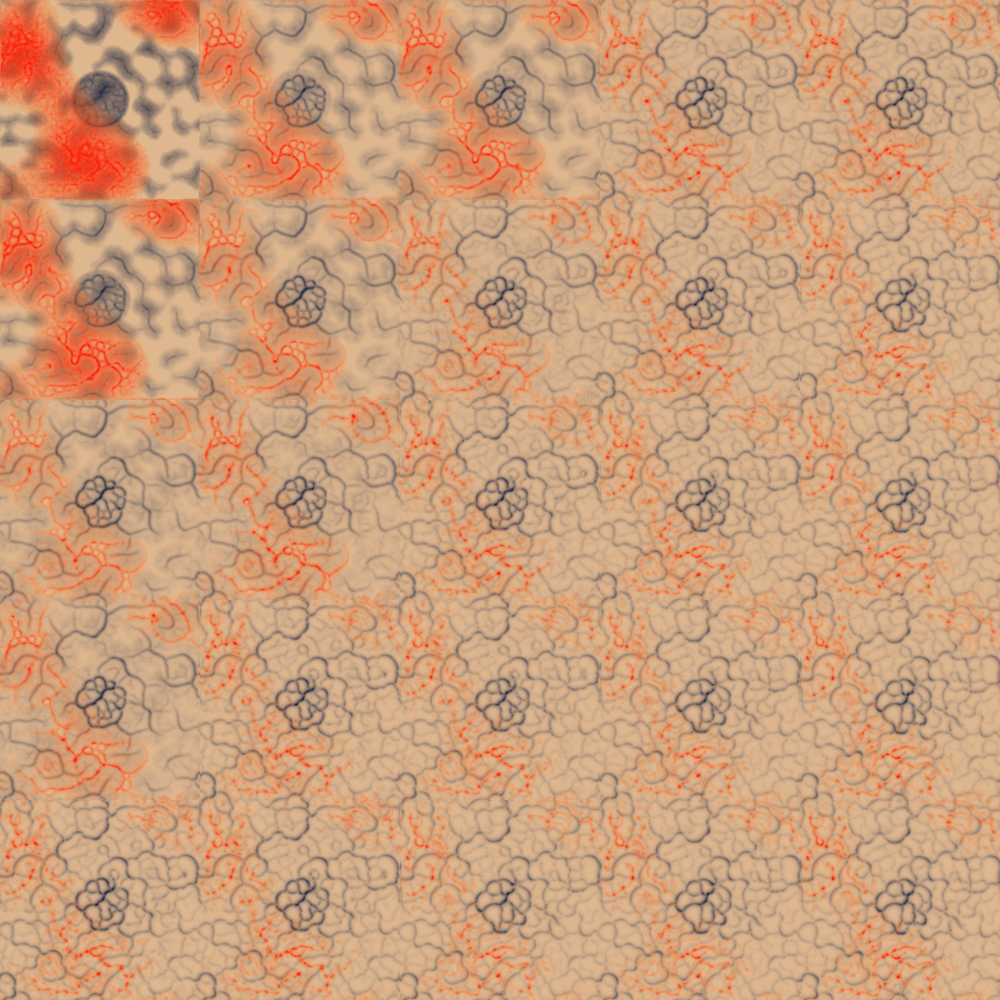

In [37]:
physarum.save_grid(images)


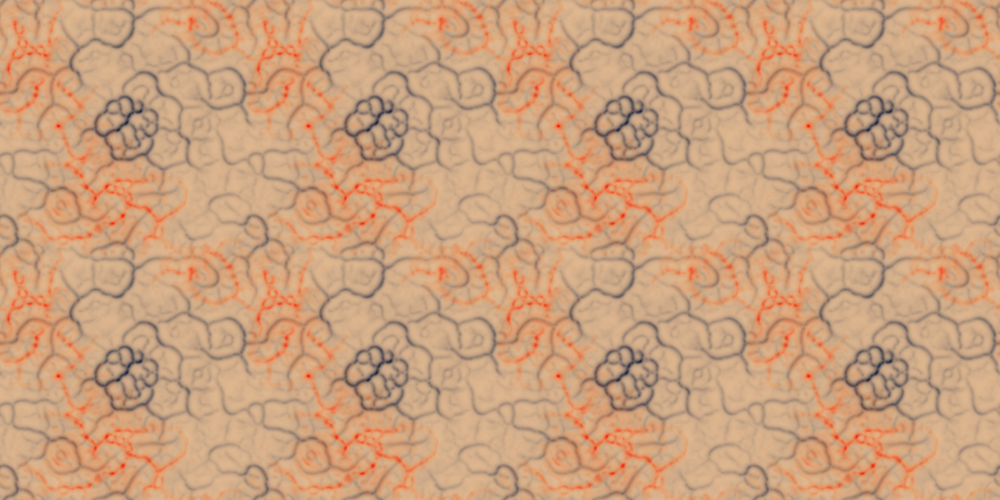

In [38]:
physarum.save_single_image_grid(images,image_no=70,dimensions=(4,2))